In [45]:
#Importing the Libraries
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#Turning off the warnings
import warnings
warnings.filterwarnings('ignore')
import scipy.stats as stats
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import plotly.express as px

In [46]:
# importing my dataset

data = pd.read_csv('fifa21_male2.csv')


In [47]:

#removing the display restrictions

pd.options.display.max_columns = None
pd.options.display.max_rows = None


data.head()

,ID,Name,Age,OVA,Nationality,Club,BOV,BP,Position,Player Photo,Club Logo,Flag Photo,POT,Team & Contract,Height,Weight,foot,Growth,Joined,Loan Date End,Value,Wage,Release Clause,Contract,Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking,Standing Tackle,Sliding Tackle,Goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total Stats,Base Stats,W/F,SM,A/W,D/W,IR,PAC,SHO,PAS,DRI,DEF,PHY,Hits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,GK,Gender
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,https://cdn.sofifa.com/players/000/002/16_120.png,https://cdn.sofifa.com/teams/55/light_60.png,https://cdn.sofifa.com/flags/it.png,69,Udinese 2008 ~ 2016,"6'0""",181lbs,Left,0,"Jul 1, 2008",NaN,€625K,€7K,€0,2008 ~ 2016,313,75,50,59,71,58.0,338,73,65.0,60,69,71,347,68,74,68.0,69,68.0,347,74,68.0,69,68,68,320,72,69.0,63.0,66.0,50,NaN,208,70,69,69.0,56,14,5,15,10,12,1929,408,3 ★,2★,Medium,High,2 ★,71,59,70,71,68,69,4,65+0,65+0,65+0,68+0,67+0,67+0,67+0,68+0,68+0,68+0,68+0,69+0,69+0,69+0,69+0,69+0,71+-2,70+-1,70+-1,70+-1,71+-2,70+-1,69+0,69+0,69+0,70+-1,17+0,Male
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,https://cdn.sofifa.com/players/000/016/19_120.png,https://cdn.sofifa.com/teams/2013/light_60.png,https://cdn.sofifa.com/flags/es.png,71,KAS Eupen 2014 ~ 2019,"5'10""",143lbs,Right,0,"Jul 19, 2014",NaN,€600K,€7K,€1.1M,2014 ~ 2019,337,68,64,61,76,68.0,369,69,79.0,79,71,71,305,56,50,62.0,65,72.0,324,75,54.0,64,60,71,362,71,71.0,72.0,73.0,75,79.0,153,70,43,40.0,56,9,12,13,11,11,1906,385,4 ★,3★,Medium,Medium,1 ★,53,69,73,69,58,63,4,67+1,67+1,67+1,67+0,68+0,68+0,68+0,67+0,70+1,70+1,70+1,68+1,70+1,70+1,70+1,68+1,62+1,66+1,66+1,66+1,62+1,60+1,60+1,60+1,60+1,60+1,17+1,Male
2,27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,https://cdn.sofifa.com/players/000/027/16_120.png,https://cdn.sofifa.com/teams/1800/light_60.png,https://cdn.sofifa.com/flags/gb-eng.png,71,Coventry City 2016 ~ 2020,"5'9""",161lbs,Right,0,"Jan 7, 2016",NaN,€1.1M,€15K,€0,2016 ~ 2020,337,80,64,41,77,75.0,387,79,84.0,77,69,78,295,48,42,71.0,59,75.0,284,72,58.0,29,56,69,317,69,39.0,69.0,74.0,66,NaN,99,35,34,30.0,51,9,6,13,16,7,1770,354,4 ★,4★,Medium,Low,2 ★,45,68,76,77,36,52,11,64+0,64+0,64+0,70+0,69+0,69+0,69+0,70+0,71+0,71+0,71+0,68+0,66+0,66+0,66+0,68+0,52+0,54+0,54+0,54+0,52+0,47+0,46+0,46+0,46+0,47+0,15+0,Male
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,https://cdn.sofifa.com/players/000/036/09_120.png,https://cdn.sofifa.com/teams/106/light_60.png,https://cdn.sofifa.com/flags/tt.png,82,Sunderland 2009,"5'11""",165lbs,Right,14,NaN,NaN,€0,€0,€0,2009,264,54,70,60,80,NaN,255,68,NaN,46,64,77,176,59,62,NaN,55,NaN,239,63,NaN,51,66,59,271,59,70.0,72.0,NaN,70,NaN,75,34,41,NaN,68,5,21,64,21,21,1348,369,3 ★,1★,NaN,NaN,1 ★,61,66,66,69,47,60,3,67+0,67+0,67+0,66+0,67+0,67+0,67+0,66+0,70+0,70+0,70+0,66+0,68+0,68+0,68+0,66+0,56+0,65+0,65+0,65+0,56+0,57+0,51+0,51+0,51+0,57+0,22+0,Male
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,https://cdn.sofifa.com/players/000/041/20_120.png,https://cdn.sofifa.com/teams/101146/light_60.png,https://cdn.sofifa.com/flags/es.png,81,Vissel Kobe 2018 ~ 2021,"5'7""",150lbs,Right,0,"Jul 16, 2018",NaN,€5.5M,€12K,€7.2M,2018 ~ 2021,367,75,69,54,90,79.0,408,85,80.0,70,83,90,346,61,56,79.0,75,75.0,297,67,40.0,58,62,70,370,58,70.0,78.0,93.0,71,89.0,181,68,57,56.0,45,6,13,6,13,7,2014,420,4 ★,4★,High,Medium,4 ★,58,70,85,85,63,59,149,72+3,72+3,72+3,79+0,79+0,79+0,79+0,79+0,82+-1,82+-1,82+-1,79+2,81+0,81+0,81+0,79+2,70+3,73+3,73+3,73+3,70+3,67+3,64+3,64+3,64+3,67+3,17+3,Male


In [48]:
# choose the columns I will need for my analysis

#data = data[['ID','Name', 'Age', 'Nationality', 'Height', 'OVA', 'Wage', 'Value', 'foot', 'BOV', 'Weight', 'Position']]
print(data.head())

   ID         Name  Age  OVA            Nationality           Club  BOV   BP  \
0   2  G. Pasquale   33   69                  Italy        Udinese   71  LWB   
1  16  Luis García   37   71                  Spain      KAS Eupen   70   CM   
2  27      J. Cole   33   71                England  Coventry City   71  CAM   
3  36     D. Yorke   36   68  Trinidad &amp; Tobago     Sunderland   70   ST   
4  41      Iniesta   36   81                  Spain    Vissel Kobe   82  CAM   

       Position                                       Player Photo  \
0            LM  https://cdn.sofifa.com/players/000/002/16_120.png   
1    CM CAM CDM  https://cdn.sofifa.com/players/000/016/19_120.png   
2  CAM RM RW LM  https://cdn.sofifa.com/players/000/027/16_120.png   
3           NaN  https://cdn.sofifa.com/players/000/036/09_120.png   
4        CM CAM  https://cdn.sofifa.com/players/000/041/20_120.png   

                                          Club Logo  \
0      https://cdn.sofifa.com/teams/55/ligh

In [49]:
# identify the column types 

data.dtypes


ID                    int64
Name                 object
Age                   int64
OVA                   int64
Nationality          object
Club                 object
BOV                   int64
BP                   object
Position             object
Player Photo         object
Club Logo            object
Flag Photo           object
POT                   int64
Team & Contract      object
Height               object
Weight               object
foot                 object
Growth                int64
Joined               object
Loan Date End        object
Value                object
Wage                 object
Release Clause       object
Contract             object
Attacking             int64
Crossing              int64
Finishing             int64
Heading Accuracy      int64
Short Passing         int64
Volleys             float64
Skill                 int64
Dribbling             int64
Curve               float64
FK Accuracy           int64
Long Passing          int64
Ball Control        

In [50]:
# format value column

def format_money(column):
    values = []
    for value in data[column]:
        if value[-1]=='M':
            money = 1000000
            money *= float(value[1:-1])
        elif value[-1]=='K':
            money = 1000
            money *= float(value[1:-1])
        else:
            money = 0
        values.append(money)
    return values

# format weight column

def format_weight():
    weights = []
    for weight in data['Weight'].fillna(''):
        if weight != '':
            weights.append(int(weight[:-3]))
        else:
            weights.append(np.nan)
    return weights

# format Height column

def format_height():
    heights = []
    for height in data['Height'].fillna(''):
        if height != '':
            height =int(height[0])*12 + int(height[2])
            heights.append(height)
        else:
            heights.append(np.nan)
    return heights

In [51]:
#running the functions to actually alter the values in the columns
data['Value'] =  format_money('Value')
data['Wage'] = format_money('Wage')
data['Weight'] = format_weight()
data['Height'] = format_height()

In [52]:
#standardize the columns
data.columns = [column.lower().replace(' ', '_') for column in data.columns]

data.head()

,id,name,age,ova,nationality,club,bov,bp,position,player_photo,club_logo,flag_photo,pot,team_&_contract,height,weight,foot,growth,joined,loan_date_end,value,wage,release_clause,contract,attacking,crossing,finishing,heading_accuracy,short_passing,volleys,skill,dribbling,curve,fk_accuracy,long_passing,ball_control,movement,acceleration,sprint_speed,agility,reactions,balance,power,shot_power,jumping,stamina,strength,long_shots,mentality,aggression,interceptions,positioning,vision,penalties,composure,defending,marking,standing_tackle,sliding_tackle,goalkeeping,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,total_stats,base_stats,w/f,sm,a/w,d/w,ir,pac,sho,pas,dri,def,phy,hits,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,gender
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,https://cdn.sofifa.com/players/000/002/16_120.png,https://cdn.sofifa.com/teams/55/light_60.png,https://cdn.sofifa.com/flags/it.png,69,Udinese 2008 ~ 2016,72,181,Left,0,"Jul 1, 2008",NaN,625000.0,7000.0,€0,2008 ~ 2016,313,75,50,59,71,58.0,338,73,65.0,60,69,71,347,68,74,68.0,69,68.0,347,74,68.0,69,68,68,320,72,69.0,63.0,66.0,50,NaN,208,70,69,69.0,56,14,5,15,10,12,1929,408,3 ★,2★,Medium,High,2 ★,71,59,70,71,68,69,4,65+0,65+0,65+0,68+0,67+0,67+0,67+0,68+0,68+0,68+0,68+0,69+0,69+0,69+0,69+0,69+0,71+-2,70+-1,70+-1,70+-1,71+-2,70+-1,69+0,69+0,69+0,70+-1,17+0,Male
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,https://cdn.sofifa.com/players/000/016/19_120.png,https://cdn.sofifa.com/teams/2013/light_60.png,https://cdn.sofifa.com/flags/es.png,71,KAS Eupen 2014 ~ 2019,61,143,Right,0,"Jul 19, 2014",NaN,600000.0,7000.0,€1.1M,2014 ~ 2019,337,68,64,61,76,68.0,369,69,79.0,79,71,71,305,56,50,62.0,65,72.0,324,75,54.0,64,60,71,362,71,71.0,72.0,73.0,75,79.0,153,70,43,40.0,56,9,12,13,11,11,1906,385,4 ★,3★,Medium,Medium,1 ★,53,69,73,69,58,63,4,67+1,67+1,67+1,67+0,68+0,68+0,68+0,67+0,70+1,70+1,70+1,68+1,70+1,70+1,70+1,68+1,62+1,66+1,66+1,66+1,62+1,60+1,60+1,60+1,60+1,60+1,17+1,Male
2,27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,https://cdn.sofifa.com/players/000/027/16_120.png,https://cdn.sofifa.com/teams/1800/light_60.png,https://cdn.sofifa.com/flags/gb-eng.png,71,Coventry City 2016 ~ 2020,69,161,Right,0,"Jan 7, 2016",NaN,1100000.0,15000.0,€0,2016 ~ 2020,337,80,64,41,77,75.0,387,79,84.0,77,69,78,295,48,42,71.0,59,75.0,284,72,58.0,29,56,69,317,69,39.0,69.0,74.0,66,NaN,99,35,34,30.0,51,9,6,13,16,7,1770,354,4 ★,4★,Medium,Low,2 ★,45,68,76,77,36,52,11,64+0,64+0,64+0,70+0,69+0,69+0,69+0,70+0,71+0,71+0,71+0,68+0,66+0,66+0,66+0,68+0,52+0,54+0,54+0,54+0,52+0,47+0,46+0,46+0,46+0,47+0,15+0,Male
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,https://cdn.sofifa.com/players/000/036/09_120.png,https://cdn.sofifa.com/teams/106/light_60.png,https://cdn.sofifa.com/flags/tt.png,82,Sunderland 2009,61,165,Right,14,NaN,NaN,0.0,0.0,€0,2009,264,54,70,60,80,NaN,255,68,NaN,46,64,77,176,59,62,NaN,55,NaN,239,63,NaN,51,66,59,271,59,70.0,72.0,NaN,70,NaN,75,34,41,NaN,68,5,21,64,21,21,1348,369,3 ★,1★,NaN,NaN,1 ★,61,66,66,69,47,60,3,67+0,67+0,67+0,66+0,67+0,67+0,67+0,66+0,70+0,70+0,70+0,66+0,68+0,68+0,68+0,66+0,56+0,65+0,65+0,65+0,56+0,57+0,51+0,51+0,51+0,57+0,22+0,Male
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,https://cdn.sofifa.com/players/000/041/20_120.png,https://cdn.sofifa.com/teams/101146/light_60.png,https://cdn.sofifa.com/flags/es.png,81,Vissel Kobe 2018 ~ 2021,67,150,Right,0,"Jul 16, 2018",NaN,5500000.0,12000.0,€7.2M,2018 ~ 2021,367,75,69,54,90,79.0,408,85,80.0,70,83,90,346,61,56,79.0,75,75.0,297,67,40.0,58,62,70,370,58,70.0,78.0,93.0,71,89.0,181,68,57,56.0,45,6,13,6,13,7,2014,420,4 ★,4★,High,Medium,4 ★,58,70,85,85,63,59,149,72+3,72+3,72+3,79+0,79+0,79+0,79+0,79+0,82+-1,82+-1,82+-1,79+2,81+0,81+0,81+0,79+2,70+3,73+3,73+3,73+3,70+3,67+3,64+3,64+3,64+3,67+3,17+3,Male


In [53]:
# get a summary of my dataframe: 
#NR of rows, columns, datatype of each column and non-NaN elements

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17125 entries, 0 to 17124
Columns: 107 entries, id to gender
dtypes: float64(12), int64(47), object(48)
memory usage: 14.0+ MB


In [54]:
# get summary of number of rows and columns as a tuple 

data.shape


(17125, 107)

In [55]:
# set id column as index

#data = data.set_index('id')

data.head()

,id,name,age,ova,nationality,club,bov,bp,position,player_photo,club_logo,flag_photo,pot,team_&_contract,height,weight,foot,growth,joined,loan_date_end,value,wage,release_clause,contract,attacking,crossing,finishing,heading_accuracy,short_passing,volleys,skill,dribbling,curve,fk_accuracy,long_passing,ball_control,movement,acceleration,sprint_speed,agility,reactions,balance,power,shot_power,jumping,stamina,strength,long_shots,mentality,aggression,interceptions,positioning,vision,penalties,composure,defending,marking,standing_tackle,sliding_tackle,goalkeeping,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,total_stats,base_stats,w/f,sm,a/w,d/w,ir,pac,sho,pas,dri,def,phy,hits,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,gender
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,https://cdn.sofifa.com/players/000/002/16_120.png,https://cdn.sofifa.com/teams/55/light_60.png,https://cdn.sofifa.com/flags/it.png,69,Udinese 2008 ~ 2016,72,181,Left,0,"Jul 1, 2008",NaN,625000.0,7000.0,€0,2008 ~ 2016,313,75,50,59,71,58.0,338,73,65.0,60,69,71,347,68,74,68.0,69,68.0,347,74,68.0,69,68,68,320,72,69.0,63.0,66.0,50,NaN,208,70,69,69.0,56,14,5,15,10,12,1929,408,3 ★,2★,Medium,High,2 ★,71,59,70,71,68,69,4,65+0,65+0,65+0,68+0,67+0,67+0,67+0,68+0,68+0,68+0,68+0,69+0,69+0,69+0,69+0,69+0,71+-2,70+-1,70+-1,70+-1,71+-2,70+-1,69+0,69+0,69+0,70+-1,17+0,Male
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,https://cdn.sofifa.com/players/000/016/19_120.png,https://cdn.sofifa.com/teams/2013/light_60.png,https://cdn.sofifa.com/flags/es.png,71,KAS Eupen 2014 ~ 2019,61,143,Right,0,"Jul 19, 2014",NaN,600000.0,7000.0,€1.1M,2014 ~ 2019,337,68,64,61,76,68.0,369,69,79.0,79,71,71,305,56,50,62.0,65,72.0,324,75,54.0,64,60,71,362,71,71.0,72.0,73.0,75,79.0,153,70,43,40.0,56,9,12,13,11,11,1906,385,4 ★,3★,Medium,Medium,1 ★,53,69,73,69,58,63,4,67+1,67+1,67+1,67+0,68+0,68+0,68+0,67+0,70+1,70+1,70+1,68+1,70+1,70+1,70+1,68+1,62+1,66+1,66+1,66+1,62+1,60+1,60+1,60+1,60+1,60+1,17+1,Male
2,27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,https://cdn.sofifa.com/players/000/027/16_120.png,https://cdn.sofifa.com/teams/1800/light_60.png,https://cdn.sofifa.com/flags/gb-eng.png,71,Coventry City 2016 ~ 2020,69,161,Right,0,"Jan 7, 2016",NaN,1100000.0,15000.0,€0,2016 ~ 2020,337,80,64,41,77,75.0,387,79,84.0,77,69,78,295,48,42,71.0,59,75.0,284,72,58.0,29,56,69,317,69,39.0,69.0,74.0,66,NaN,99,35,34,30.0,51,9,6,13,16,7,1770,354,4 ★,4★,Medium,Low,2 ★,45,68,76,77,36,52,11,64+0,64+0,64+0,70+0,69+0,69+0,69+0,70+0,71+0,71+0,71+0,68+0,66+0,66+0,66+0,68+0,52+0,54+0,54+0,54+0,52+0,47+0,46+0,46+0,46+0,47+0,15+0,Male
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,https://cdn.sofifa.com/players/000/036/09_120.png,https://cdn.sofifa.com/teams/106/light_60.png,https://cdn.sofifa.com/flags/tt.png,82,Sunderland 2009,61,165,Right,14,NaN,NaN,0.0,0.0,€0,2009,264,54,70,60,80,NaN,255,68,NaN,46,64,77,176,59,62,NaN,55,NaN,239,63,NaN,51,66,59,271,59,70.0,72.0,NaN,70,NaN,75,34,41,NaN,68,5,21,64,21,21,1348,369,3 ★,1★,NaN,NaN,1 ★,61,66,66,69,47,60,3,67+0,67+0,67+0,66+0,67+0,67+0,67+0,66+0,70+0,70+0,70+0,66+0,68+0,68+0,68+0,66+0,56+0,65+0,65+0,65+0,56+0,57+0,51+0,51+0,51+0,57+0,22+0,Male
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,https://cdn.sofifa.com/players/000/041/20_120.png,https://cdn.sofifa.com/teams/101146/light_60.png,https://cdn.sofifa.com/flags/es.png,81,Vissel Kobe 2018 ~ 2021,67,150,Right,0,"Jul 16, 2018",NaN,5500000.0,12000.0,€7.2M,2018 ~ 2021,367,75,69,54,90,79.0,408,85,80.0,70,83,90,346,61,56,79.0,75,75.0,297,67,40.0,58,62,70,370,58,70.0,78.0,93.0,71,89.0,181,68,57,56.0,45,6,13,6,13,7,2014,420,4 ★,4★,High,Medium,4 ★,58,70,85,85,63,59,149,72+3,72+3,72+3,79+0,79+0,79+0,79+0,79+0,82+-1,82+-1,82+-1,79+2,81+0,81+0,81+0,79+2,70+3,73+3,73+3,73+3,70+3,67+3,64+3,64+3,64+3,67+3,17+3,Male


In [56]:
data.dtypes

id                    int64
name                 object
age                   int64
ova                   int64
nationality          object
club                 object
bov                   int64
bp                   object
position             object
player_photo         object
club_logo            object
flag_photo           object
pot                   int64
team_&_contract      object
height                int64
weight                int64
foot                 object
growth                int64
joined               object
loan_date_end        object
value               float64
wage                float64
release_clause       object
contract             object
attacking             int64
crossing              int64
finishing             int64
heading_accuracy      int64
short_passing         int64
volleys             float64
skill                 int64
dribbling             int64
curve               float64
fk_accuracy           int64
long_passing          int64
ball_control        

In [57]:
data.columns.values

array(['id', 'name', 'age', 'ova', 'nationality', 'club', 'bov', 'bp',
       'position', 'player_photo', 'club_logo', 'flag_photo', 'pot',
       'team_&_contract', 'height', 'weight', 'foot', 'growth', 'joined',
       'loan_date_end', 'value', 'wage', 'release_clause', 'contract',
       'attacking', 'crossing', 'finishing', 'heading_accuracy',
       'short_passing', 'volleys', 'skill', 'dribbling', 'curve',
       'fk_accuracy', 'long_passing', 'ball_control', 'movement',
       'acceleration', 'sprint_speed', 'agility', 'reactions', 'balance',
       'power', 'shot_power', 'jumping', 'stamina', 'strength',
       'long_shots', 'mentality', 'aggression', 'interceptions',
       'positioning', 'vision', 'penalties', 'composure', 'defending',
       'marking', 'standing_tackle', 'sliding_tackle', 'goalkeeping',
       'gk_diving', 'gk_handling', 'gk_kicking', 'gk_positioning',
       'gk_reflexes', 'total_stats', 'base_stats', 'w/f', 'sm', 'a/w',
       'd/w', 'ir', 'pac', 'sho', 'p

In [ ]:
# drop the columns I won't need

data = data.drop(['flag_photo', 'player_photo', 'club_logo', 'team_&_contract', 'foot', 'growth', 'joined',
       'loan_date_end','gender'], axis=1)

In [59]:
data.columns.values

array(['id', 'name', 'age', 'ova', 'nationality', 'club', 'bov', 'bp',
       'position', 'pot', 'height', 'weight', 'value', 'wage',
       'release_clause', 'contract', 'attacking', 'crossing', 'finishing',
       'heading_accuracy', 'short_passing', 'volleys', 'skill',
       'dribbling', 'curve', 'fk_accuracy', 'long_passing',
       'ball_control', 'movement', 'acceleration', 'sprint_speed',
       'agility', 'reactions', 'balance', 'power', 'shot_power',
       'jumping', 'stamina', 'strength', 'long_shots', 'mentality',
       'aggression', 'interceptions', 'positioning', 'vision',
       'penalties', 'composure', 'defending', 'marking',
       'standing_tackle', 'sliding_tackle', 'goalkeeping', 'gk_diving',
       'gk_handling', 'gk_kicking', 'gk_positioning', 'gk_reflexes',
       'total_stats', 'base_stats', 'w/f', 'sm', 'a/w', 'd/w', 'ir',
       'pac', 'sho', 'pas', 'dri', 'def', 'phy', 'hits', 'ls', 'st', 'rs',
       'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm'

In [ ]:
data.shape

In [ ]:
data.describe()

In [62]:
# find correlation
data.corr()

,id,age,ova,bov,pot,height,weight,value,wage,attacking,crossing,finishing,heading_accuracy,short_passing,volleys,skill,dribbling,curve,fk_accuracy,long_passing,ball_control,movement,acceleration,sprint_speed,agility,reactions,balance,power,shot_power,jumping,stamina,strength,long_shots,mentality,aggression,interceptions,positioning,vision,penalties,composure,defending,marking,standing_tackle,sliding_tackle,goalkeeping,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,total_stats,base_stats,pac,sho,pas,dri,def,phy
id,1.000000,-0.743844,-0.431079,-0.385713,0.042604,-0.053153,-0.196765,-0.094638,-0.224397,-0.178002,-0.152858,-0.110723,-0.148036,-0.173987,-0.207462,-0.175488,-0.061919,-0.200482,-0.232269,-0.215201,-0.134706,0.062316,0.167381,0.170565,0.019658,-0.421033,0.039317,-0.224439,-0.279340,-0.145467,0.014947,-0.246480,-0.185208,-0.246674,-0.223598,-0.157559,-0.127911,-0.247664,-0.218133,-0.423060,-0.070775,-0.106629,-0.073895,-0.056243,-0.095273,-0.089003,-0.100717,-0.122380,-0.106509,-0.094745,-0.236634,-0.339341,0.175293,-0.284713,-0.366366,-0.232583,-0.165248,-0.295857
age,-0.743844,1.000000,0.517099,0.456734,-0.237619,0.067408,0.258682,0.095981,0.203035,0.183954,0.151022,0.105311,0.172793,0.176786,0.187794,0.168876,0.039607,0.181021,0.223884,0.223088,0.121097,-0.055642,-0.186610,-0.180717,-0.041488,0.501010,-0.085861,0.310459,0.304947,0.197371,0.069741,0.350439,0.190803,0.272976,0.276063,0.192996,0.122566,0.236343,0.198917,0.421126,0.114796,0.155497,0.106178,0.086021,0.125933,0.120891,0.125251,0.130810,0.134369,0.121822,0.280383,0.414897,-0.177291,0.309438,0.396082,0.241027,0.223184,0.436462
ova,-0.431079,0.517099,1.000000,0.985877,0.592268,0.027906,0.151834,0.631679,0.595568,0.431238,0.386334,0.304012,0.305553,0.492372,0.362712,0.441689,0.350249,0.399299,0.369278,0.482655,0.431284,0.302267,0.143928,0.153476,0.227253,0.870084,0.100938,0.546417,0.534829,0.259915,0.335108,0.338347,0.390849,0.495097,0.382813,0.305286,0.339838,0.507683,0.317666,0.706141,0.248247,0.290071,0.237478,0.209961,0.038222,0.037851,0.037993,0.038650,0.044653,0.037284,0.607676,0.832618,0.201319,0.487060,0.699229,0.643427,0.344906,0.543354
bov,-0.385713,0.456734,0.985877,1.000000,0.628323,0.020761,0.132560,0.640818,0.595060,0.464329,0.400046,0.336488,0.335677,0.533046,0.388301,0.473888,0.388163,0.419413,0.387289,0.515422,0.471454,0.335011,0.179547,0.189491,0.256046,0.870157,0.128361,0.572275,0.550932,0.264297,0.368788,0.335436,0.419660,0.523526,0.400031,0.320034,0.368287,0.530160,0.340311,0.721989,0.267770,0.309674,0.257583,0.228406,-0.008702,-0.008851,-0.008312,-0.006124,-0.000933,-0.008819,0.635037,0.830127,0.212889,0.478573,0.689975,0.640746,0.349906,0.535579
pot,0.042604,-0.237619,0.592268,0.628323,1.000000,0.000872,-0.039809,0.563570,0.462596,0.233866,0.210944,0.173281,0.137199,0.318544,0.177787,0.265503,0.264651,0.221502,0.166233,0.283647,0.292414,0.258243,0.197884,0.197396,0.190508,0.471139,0.132298,0.221586,0.266902,0.076414,0.170122,0.030991,0.191780,0.243646,0.139444,0.143810,0.191976,0.306404,0.147044,0.369826,0.138748,0.147320,0.138787,0.129735,-0.007277,-0.005874,-0.005240,-0.002734,-0.004015,-0.005215,0.329178,0.474763,0.259294,0.244481,0.395773,0.445004,0.170562,0.159959
height,-0.053153,0.067408,0.027906,0.020761,0.000872,1.000000,0.509748,0.006218,0.016724,-0.302467,-0.407828,-0.292667,0.003434,-0.288981,-0.277786,-0.367327,-0.390358,-0.356583,-0.320903,-0.254920,-0.333610,-0.470089,-0.422569,-0.355871,-0.472369,-0.004854,-0.548305,-0.143235,-0.139374,-0.005301,-0.244175,0.349361,-0.304802,-0.262696,-0.039312,-0.052342,-0.354896,-0.290900,-0.254654,-0.120232,-0.061255,-0.057965,-0.057684,-0.064350,0.290178,0.287346,0.286618,0.277338,0.287007,0.287657,-0.306203,-0.110162,-0.280005,-0.071968,-0.162048,-0.229319,0.052625,0.279944
weight,-0.196765,0.258682,0.151834,0.132560,-0.039809,0.509748,1.000000,0.040257,0.069180,-0.258559,-0.394283,-0.270512,0.090842,-0.266584,-0.235835,-0.355846,-0.402090,-0.341532,-0.296945,-0.235302,-

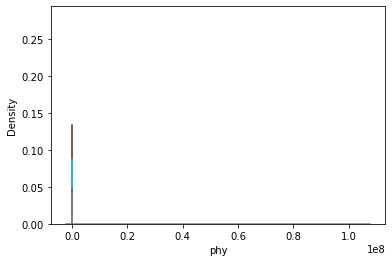

In [63]:
for column in data.select_dtypes(np.number).columns:
    sns.distplot(data[column])
    plt.show

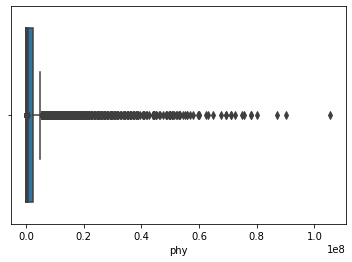

In [64]:
for column in data.select_dtypes(np.number).columns:
    sns.boxplot(data[column])
    plt.show

In [65]:
#group players by position 
pos_cnt=data.groupby('bp').apply(lambda x:x['name'].count()).reset_index(name='Counts')
pos_cnt.sort_values(by='Counts',ascending=False,inplace=True)
top_20_pos_cnt=pos_cnt[:20]
fig=px.bar(top_20_pos_cnt,x='bp',y='Counts',color='Counts',title='Positionwise Player counts in FIFA 21')
fig.show()

In [163]:
#group players by nationality 
pos_cnt=data.groupby('nationality').apply(lambda x:x['name'].count()).reset_index(name='Counts')
pos_cnt.sort_values(by='Counts',ascending=False,inplace=True)
top_20_pos_cnt=pos_cnt[:10]
fig=px.bar(top_20_pos_cnt,x='nationality',y='Counts',color='Counts',title='Top Nationalities in FIFA 21')
fig.show()

In [165]:
# based on the foot players use, which is considered more valuable

fig = px.pie(data, values='wage', names='feet', color='wage',
             color_discrete_map={'Right':'lightcyan',
                                 'Left':'cyan'})
fig.show()

#age distribution 
age_cnt=data.groupby('age').apply(lambda x:x['name'].count()).reset_index(name='Counts')
fig=px.bar(age_cnt,x='age',y='Counts',color='Counts',title='Player/age distribution in FIFA 21')
fig.show()


ValueError: Value of 'names' is not the name of a column in 'data_frame'. Expected one of ['id', 'name', 'age', 'ova', 'nationality', 'club', 'bov', 'bp', 'position', 'pot', 'height', 'weight', 'value', 'wage', 'release_clause', 'contract', 'attacking', 'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys', 'skill', 'dribbling', 'curve', 'fk_accuracy', 'long_passing', 'ball_control', 'movement', 'acceleration', 'sprint_speed', 'agility', 'reactions', 'balance', 'power', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots', 'mentality', 'aggression', 'interceptions', 'positioning', 'vision', 'penalties', 'composure', 'defending', 'marking', 'standing_tackle', 'sliding_tackle', 'goalkeeping', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_positioning', 'gk_reflexes', 'total_stats', 'base_stats', 'w/f', 'sm', 'a/w', 'd/w', 'ir', 'pac', 'sho', 'pas', 'dri', 'def', 'phy', 'hits', 'ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb', 'gk'] but received: feet

In [164]:

#age distribution 
age_cnt=data.groupby('age').apply(lambda x:x['name'].count()).reset_index(name='Counts')
fig=px.bar(age_cnt,x='age',y='Counts',color='Counts',title='Player/age distribution in FIFA 21')
fig.show()

In [166]:
# wage compared to value

cost_prop=data[['name','club','nationality','wage','value','bp']]
cost_prop['value']=pd.to_numeric(cost_prop['value'])
cost_prop['value in €']=cost_prop['value']*cost_prop['wage']/1000000
fig=px.scatter(cost_prop,x='value',y='wage',color='value in €',size='wage',hover_data=['name','club','nationality','bp'],title='Value vs Wage Presentation of all the Players')
fig.show()

In [167]:
# best players 

top_play=data[['name','ova','age','club','bp']]
top_play.sort_values(by='ova',ascending=False,inplace=True)
top_30_play=top_play[:100]
fig=px.scatter(top_30_play,x='age',y='ova',color='age',size='ova',hover_data=['name','club','bp'],title='Top Football Players in the FIFA 21 game')
fig.show()

In [26]:
# top valued players

top_play=data[['name','value','age','club','bp']]
top_play.sort_values(by='value',ascending=False,inplace=True)
top_30_play=top_play[:100]
fig=px.scatter(top_30_play,x='age',y='value',color='age',size='value',hover_data=['name','club','bp'],title='Top Valued Football Players in the FIFA 21 game')
fig.show()

In [171]:

# wage compared to value
cost_prop=data[['name','pot','club','nationality','wage','value','bp']]
cost_prop['pot']=pd.to_numeric(cost_prop['pot'])
cost_prop['pot in €']=cost_prop['pot']*cost_prop['wage']/1000000
fig=px.scatter(cost_prop,x='wage',y='pot',color='pot in €',size='wage',hover_data=['name','club','nationality','bp'],title='Value vs Potential Presentation of all the Players')
fig.show()

In [ ]:
# find the mean in weight

weight_mean = data['weight'].mean()
print(weight_mean)

#create histogram

sns.set()
data['weight'].hist(bins = 15)

In [136]:
data.dtypes

id                    int64
name                 object
age                   int64
ova                   int64
nationality          object
club                 object
bov                   int64
bp                   object
position             object
pot                   int64
height                int64
weight                int64
value               float64
wage                float64
release_clause       object
contract             object
attacking             int64
crossing              int64
finishing             int64
heading_accuracy      int64
short_passing         int64
volleys             float64
skill                 int64
dribbling             int64
curve               float64
fk_accuracy           int64
long_passing          int64
ball_control          int64
movement              int64
acceleration          int64
sprint_speed          int64
agility             float64
reactions             int64
balance             float64
power                 int64
shot_power          

In [139]:
data1 = data[['age','value', 'bp', 'wage','total_stats', 'position', 'ova', 'pot']]

data1.head()

,age,value,bp,wage,total_stats,position,ova,pot
0,33,625000.0,LWB,7000.0,1929,LM,69,69
1,37,600000.0,CM,7000.0,1906,CM CAM CDM,71,71
2,33,1100000.0,CAM,15000.0,1770,CAM RM RW LM,71,71
3,36,0.0,ST,0.0,1348,NaN,68,82
4,36,5500000.0,CAM,12000.0,2014,CM CAM,81,81


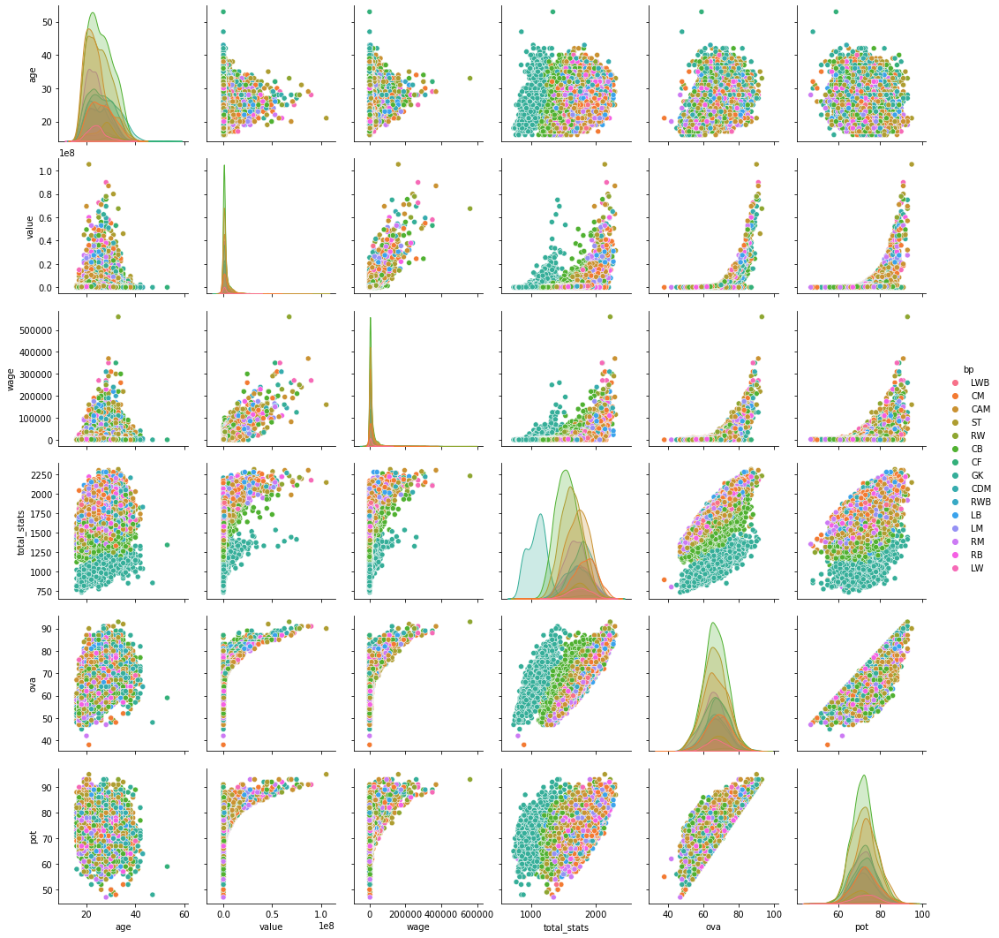

In [140]:
# covariance visualization
sns.pairplot(data1, hue="bp")

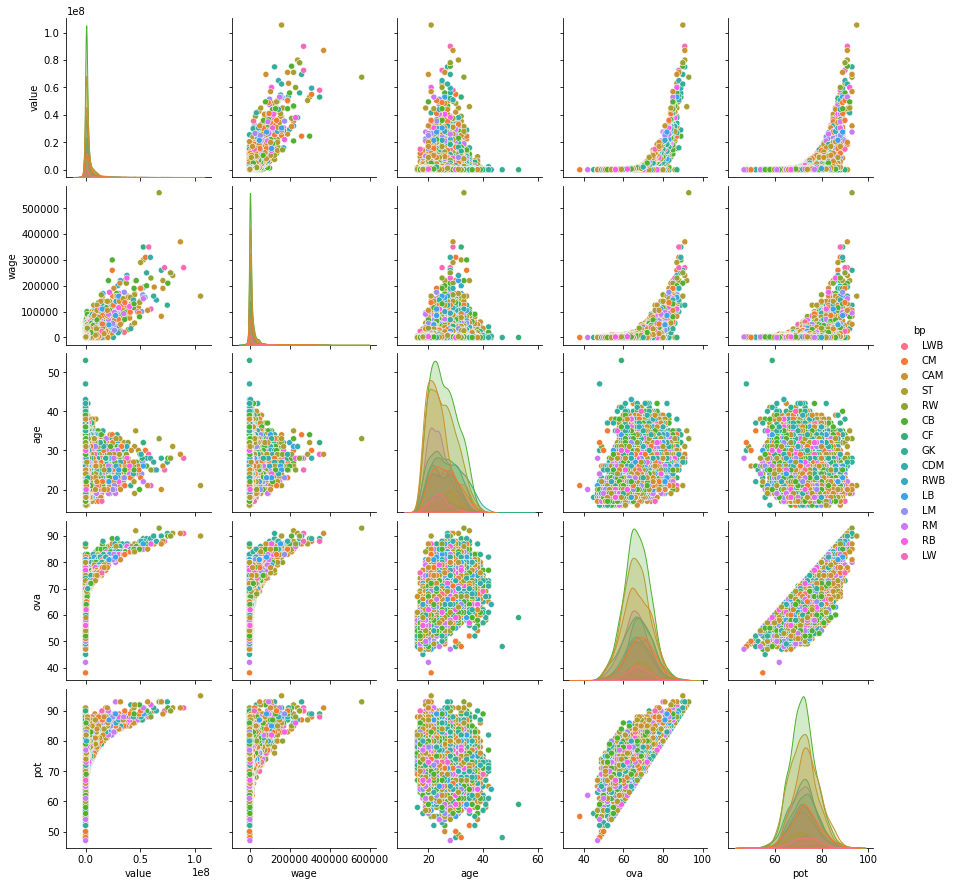

In [174]:
# covariance visualization

data2 = data[['value','bp', 'wage','age', 'nationality', 'ova', 'pot']]

sns.pairplot(data2, hue="bp")

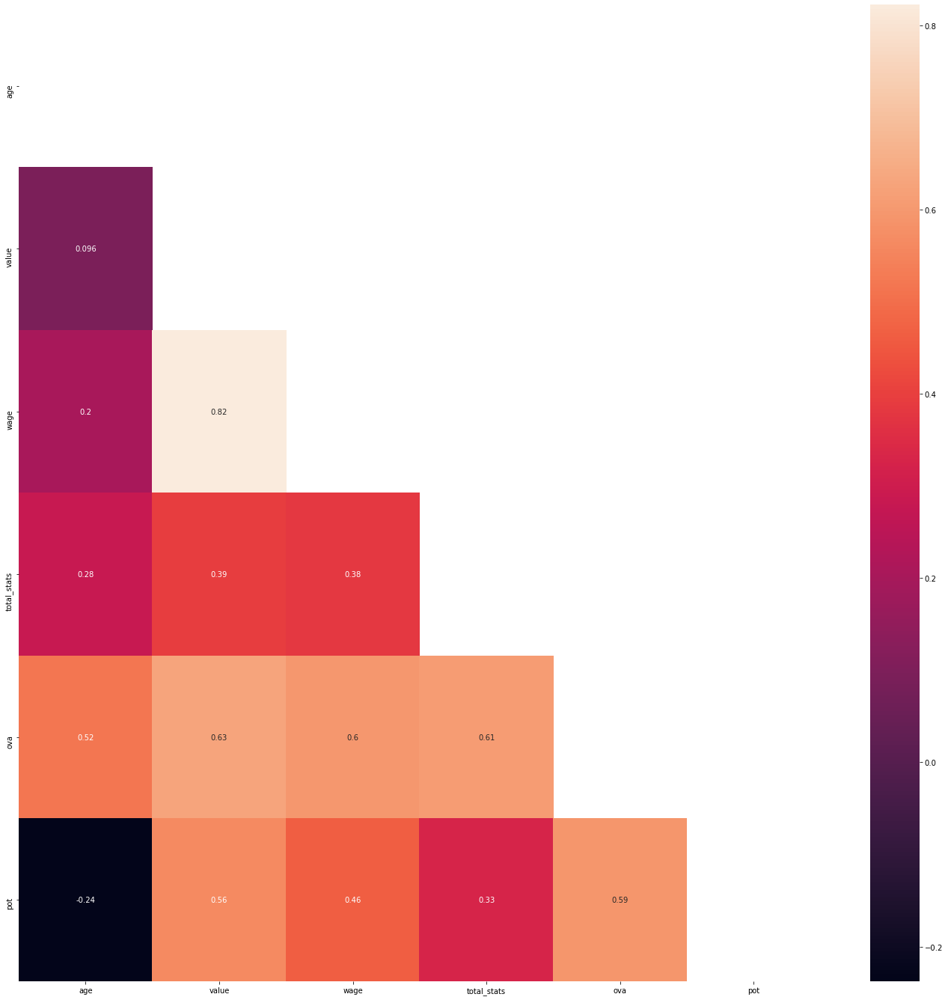

In [141]:

# check the correlations
mask = np.zeros_like(data1.corr())

mask[np.triu_indices_from(mask)] = True # optional, to hide repeat half of the matrix

fig, ax = plt.subplots(figsize=(24, 24))
ax = sns.heatmap(data1.corr(), mask=mask, annot=True)
plt.show()

In [142]:
def boxcox_transform(data1):
    numeric_cols = data1.select_dtypes(np.number).columns
    _ci = {column: None for column in numeric_cols}
    for column in numeric_cols:
        # since i know any columns should take negative numbers, to avoid -inf in df
        data1[column] = np.where(data1[column]<=0, np.NAN, data1[column]) 
        data1[column] = data1[column].fillna(data1[column].mean())
        transformed_data, ci = stats.boxcox(data1[column])
        data1[column] = transformed_data
        _ci[column] = ci
    return data1, _ci

In [ ]:

data1, _ci = boxcox_transform(data1)
_ci

In [143]:
def remove_outliers(data1, threshold=1.5, in_columns=data1.select_dtypes(np.number).columns, skip_columns=[]):
    for column in in_columns:
        if column not in skip_columns:
            upper = np.percentile(data1[column],75)
            lower = np.percentile(data1[column],25)
            iqr = upper - lower
            upper_limit = upper + threshold * iqr
            lower_limit = lower - threshold * iqr
            data1 = data1[(data1[column]>lower_limit) & (data1[column]<upper_limit)]
    return data1

In [109]:
df1 = remove_outliers(data1, threshold=2) # we don't want to reduce our data too much,
## but we can play with the parameters to see,
## so after a better analysis we can choose which columns to drop outliers or not
#df1

In [110]:
df2 = remove_outliers(df1, threshold=1.5, in_columns=['value'])
# now filter tIndexError: cannot do a non-empty take from an empty axes.he outliers on the more important columns with a tighter threshold
#df2

In [111]:
# encoding categorical
df3 = pd.get_dummies(df2, drop_first=True) 
#df3 = df2.drop('Club', axis=1)

In [112]:
# splitting our data

X = df3.drop('value', axis=1)
y = df3['value']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [182]:
X_train.shape

(8562, 57)

In [181]:
df3.columns


Index(['age', 'value', 'wage', 'total_stats', 'ova', 'pot',
       'nationality_Albania', 'nationality_Algeria', 'nationality_Andorra',
       'nationality_Angola',
       ...
       'position_ST RM RB', 'position_ST RM RW', 'position_ST RM RWB',
       'position_ST RW', 'position_ST RW CAM', 'position_ST RW CAM RM',
       'position_ST RW CF', 'position_ST RW LM', 'position_ST RW LW',
       'position_ST RW RM'],
      dtype='object', length=791)

In [175]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [176]:
predictions = model.predict(X_test)


In [183]:

r2_score(y_test, predictions), mean_absolute_error(y_test, predictions), mean_squared_error(y_test, predictions, squared=False)
#if we let 'name', 'age','value', 'wage','total_stats', 'height', 'weight', 'position', 'ova', 'pot' => (-820329.147833436, 20.597642668520216, 507.6455440035687)
#fifa2021_more_testing = fifa2021[['name', 'age','value', 'wage','total_stats', 'position', 'ova', 'pot']] => (0.8820769680764409, 0.12436403537418955, 0.19075395763473413)
#fifa2021_more_testing = fifa2021[['age','value', 'wage','total_stats', 'position', 'ova', 'pot']] => (0.9169588697407761, 0.09367178456806254, 0.1600740247572928)

(0.7406593566300013, 1476459.4967970506, 2804007.4868138786)

<AxesSubplot:ylabel='value'>

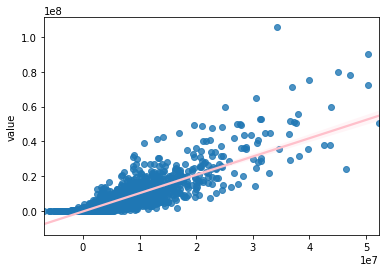

In [184]:


sns.regplot(predictions, y_test, line_kws={"color": "pink"})

In [179]:
len(predictions)


8563

In [180]:
len(y_test)


8563

In [154]:
from collections import Counter
print(Counter(data['nationality'].values))

Counter({'England': 1707, 'Germany': 1154, 'Spain': 1121, 'France': 990, 'Brazil': 857, 'Argentina': 778, 'Italy': 565, 'Netherlands': 475, 'Portugal': 365, 'United States': 358, 'Mexico': 345, 'Uruguay': 335, 'Colombia': 305, 'Japan': 295, 'Poland': 291, 'Scotland': 281, 'Republic of Ireland': 278, 'Belgium': 263, 'Norway': 260, 'Sweden': 260, 'Denmark': 258, 'Austria': 245, 'Turkey': 226, 'Switzerland': 211, 'Chile': 180, 'Paraguay': 180, 'Romania': 166, 'Korea Republic': 155, 'Australia': 149, 'Nigeria': 141, 'Senegal': 141, 'Croatia': 141, 'Venezuela': 140, 'Peru': 138, 'Ecuador': 137, 'Ghana': 135, 'Wales': 133, 'Serbia': 131, 'China PR': 131, 'Czech Republic': 124, 'Ivory Coast': 119, 'Russia': 114, 'Saudi Arabia': 103, 'Cameroon': 96, 'Greece': 96, 'Canada': 96, 'Morocco': 91, 'Northern Ireland': 81, 'Ukraine': 72, 'Mali': 70, 'DR Congo': 69, 'Bosnia Herzegovina': 68, 'Finland': 61, 'Bolivia': 59, 'Slovakia': 58, 'South Africa': 57, 'Slovenia': 53, 'Iceland': 52, 'Algeria': 51, 

In [155]:
#print(Counter(data['nationality'].values).most_common(10))

topnat = Counter(data['nationality'].values).most_common(10)

print(topnat)

[('England', 1707), ('Germany', 1154), ('Spain', 1121), ('France', 990), ('Brazil', 857), ('Argentina', 778), ('Italy', 565), ('Netherlands', 475), ('Portugal', 365), ('United States', 358)]


[('England', 1707), ('Germany', 1154), ('Spain', 1121), ('France', 990), ('Brazil', 857), ('Argentina', 778), ('Italy', 565), ('Netherlands', 475)]


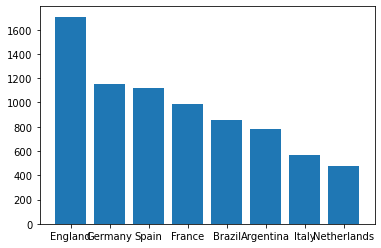

In [77]:
print(Counter(data['nationality'].values).most_common(8))


bar_plot = dict(Counter(data['nationality'].values).most_common(8))
plt.bar(*zip(*bar_plot.items()))
plt.show()




In [156]:
# find the most common countries

def plot_most_common(nationality):
    bar_plot = dict(Counter(data[nationality].values).most_common(10))
    plt.bar(*zip(*bar_plot.items()))
    plt.show()



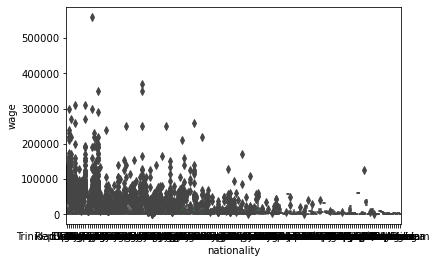

In [86]:
sns.boxplot(x= data['nationality'], y = data['wage'])
plt.show()

In [ ]:
sns.boxplot(x= data['nationality'], y = data['weight'])
plt.show()

In [157]:
# Prediction preperation


X = data.select_dtypes(include=['float64', 'int64']).drop(['value'], axis=1) #removing target to ensure model gives valid results

X = pd.DataFrame(X).fillna(X.mean())

y = data['value'] # the prediction

In [158]:
# split train/test

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

model = LinearRegression()
model.fit(X_train,y_train)

predictions = model.predict(X_test)

In [127]:
lm = LinearRegression()  # start model object

model = lm.fit(X,y)

In [159]:
# evaluating sklearn's LR model

predictions = lm.predict(X_test) # predict some values

rmse = mean_squared_error(y_test, predictions, squared = False) # or mse with squared=True
# r2 gives you an overall estimate of how good the model is, between 0 (lowest) and 1 (highest)
# rmse, good to see if the errors are big, the values returnes are in the unit of the target
print("R2_score:", round(lm.score(X,y),2)) # or r2_score(Y, predictions)
print("RMSE:", rmse)

#0.75 if we remove release_clause

R2_score: 0.75
RMSE: 2783510.7736251885


<AxesSubplot:ylabel='value'>

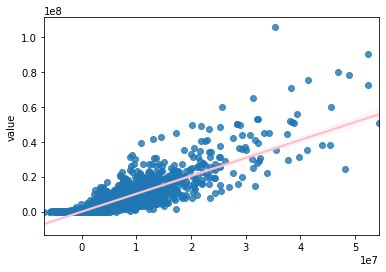

In [160]:
sns.regplot(predictions, y_test, line_kws={"color": "pink"})

In [ ]:
# covariance visualization
sns.pairplot(data)